In [40]:
# para que los cambios en .scr se reflejen en el notebook
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [41]:
# para usar los modulos de src
import sys
from pathlib import Path
notebook_path = Path().resolve()
project_root = notebook_path.parent
sys.path.append(str(project_root))

# carga las variables de entorno
from dotenv import load_dotenv
load_dotenv()

False

# EDA

## librerias necesarias

In [42]:
from src.utils.project_paths import RAW_DATA_DIR, ROOT_DIR, FIGURES_DIR
from src.utils.plot_styles import PaletaPlotly,PaletaSeaborn
from src.data.transformations import analyze_outliers_with_target
import pandas as pd
# para graficos
import plotly
import kaleido
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
# hide warnings
import warnings
warnings.filterwarnings('ignore')

In [43]:
paleta = PaletaPlotly()
paleta_seaborn = PaletaSeaborn()

### cargar los archivos

In [44]:
data_file_path = RAW_DATA_DIR / 'CARTERA_PRUEBA_TECNICA.csv'
if data_file_path.exists():
    df_cartera = pd.read_csv(data_file_path)
else:
    print(f'No existe el archivo {data_file_path}')

In [45]:
# vistazo a los datos
print(df_cartera.shape)
df_cartera.head()

(21499, 41)


,aniomes,telefono,account_num,target,vnc_no,vencimiento,decil_max_ultimos3m_totalmonto,decil_max_ultimos3m_pago,forma_pago,datos_curso_q,...,max_trimestral_sobrefacturacion,pct_datos_4g,no_exitoso,monto_total_cp_ultimomes,promedio_semestral_sobrefacturacion,cantidad_minutos_mes,max_ultimos3m_pago,n_entrantes_offnet,monto_pago_cp_ultimomes,conteo_vecesen_finterm
0,202401,1773210294,1812120285,0,0.0,0.0,9,9,DOMICILIADO,1,...,0.871757,0.966336,87.0,36.69,0.826413,513.449994,113.69,63,36.69,0
1,202312,1284496476,1258714049,0,1.0,0.0,2,2,DOMICILIADO,2,...,1.044287,0.000000,27.0,10.99,0.000000,3.866667,33.87,6,10.99,0
2,202311,1312772779,1745686591,1,1.0,1.0,4,4,NO_DOMICILIADO,3,...,0.851603,0.967840,100.0,13.03,0.833982,33.233334,40.23,29,13.03,0
3,202312,1886941825,1930858772,1,1.0,1.0,2,2,NO_DOMICILIADO,3,...,0.892761,0.476536,120.0,11.19,0.892761,184.533333,33.57,153,11.19,0
4,202312,1124231538,1411143386,0,1.0,0.0,7,7,NO_DOMICILIADO,4,...,0.892946,0.923823,25.0,22.23,0.885270,5.733333,62.21,5,22.23,0


## Datos nulos o faltantes

In [46]:
df_cartera_nan = df_cartera[df_cartera.isnull().any(axis=1)]
print(f'Cantidad de registros con valores nulos: {df_cartera_nan.shape[0]}')
print(f'Porcentaje de registros con valores nulos: {df_cartera_nan.shape[0]/df_cartera.shape[0]*100:.2f}%')

Cantidad de registros con valores nulos: 1414
Porcentaje de registros con valores nulos: 6.58%


In [47]:
df_nulos=df_cartera.isna().sum().sort_values(ascending=False).reset_index().rename(columns={'index':'columna',0:'cantidad'})
df_nulos['porcentaje']=(df_nulos['cantidad']/df_cartera.shape[0]).mul(100).round(2)
df_nulos=df_nulos[df_nulos['cantidad']>0]
df_nulos

,columna,cantidad,porcentaje
0,vnc_no,1075,5.00
1,vencimiento,1075,5.00
2,n_salientes_offnet,1075,5.00
3,dias_hasta_elpago_ultimomes,358,1.67


In [48]:
for col in df_nulos['columna']:
    df_cartera.groupby('aniomes')[col].value_counts(dropna=False,normalize=True).unstack().to_string()

## Estadisticos desciptivos de las columnas 

In [49]:
df_cartera.iloc[:,0:10].drop(columns=["aniomes","telefono","account_num",'target']).describe()

,vnc_no,vencimiento,decil_max_ultimos3m_totalmonto,decil_max_ultimos3m_pago,datos_curso_q
count,20424.000000,20424.000000,21499.000000,21499.000000,21499.000000
mean,0.884694,0.625685,5.891111,5.885250,2.785060
std,0.319398,0.483957,3.669630,3.659754,1.350683
min,0.000000,0.000000,1.000000,1.000000,1.000000
25%,1.000000,0.000000,3.000000,3.000000,2.000000
50%,1.000000,1.000000,6.000000,6.000000,3.000000
75%,1.000000,1.000000,8.000000,8.000000,4.000000
max,1.000000,1.000000,20.000000,20.000000,5.000000


In [50]:
df_cartera.iloc[:,10:20].describe()

,max_diferencia_dias_ultimos3m,n_ses_datos,promedio_ultimos3m_finterm,pct_datos_3g,datos_curso,dias_hasta_elpago_ultimomes,sobrefacturacion,promedio_ultimos3m_mora,tot_dow_datos_3g
count,21499.000000,21499.000000,21499.000000,21499.000000,21499.000000,21141.000000,21499.000000,21499.000000,21499.000000
mean,25.632215,4095.824131,14.000217,0.146385,10286.601360,-8.952604,1.188867,2.052055,1087.231365
std,28.978778,3474.424103,84.588692,0.252551,12437.778407,11.015227,2.622461,16.608714,3005.817400
min,-310.000000,0.000000,-0.000460,0.000000,0.000000,-220.000000,0.000000,0.000000,0.000000
25%,13.000000,1969.500000,0.000000,0.013229,3149.491606,-9.000000,1.000000,0.000000,66.181901
50%,17.000000,3517.000000,0.000000,0.046908,7549.402596,-6.000000,1.000000,0.000000,287.520572
75%,28.000000,5425.000000,0.000000,0.133215,13574.340593,-4.000000,1.095359,0.000000,898.510411
max,649.000000,153347.000000,2649.000000,1.000000,493711.993183,310.000000,160.593792,1320.709961,90686.643332


In [51]:
df_cartera.iloc[:,20:30].describe()

,tot_up_datos_4g,edad,pct_pagos,ratio_recurrencia_cartera,sum_min_entrantes_offnet,arpu_,n_salientes_offnet,tot_dura_datos_2g,prom_num_fechas_pago_ultimos3m,antiguedad
count,21499.000000,21499.000000,21499.000000,21499.000000,21499.000000,21499.000000,20424.000000,21499.000000,21499.000000,21499.000000
mean,810.285460,45.301713,1.008800,0.505013,98.178666,15.205791,88.604387,8.348764,3.262710,40.381506
std,1245.544687,15.558839,3.574367,0.340232,169.765940,7.509796,116.163812,46.573165,1.139906,40.801449
min,0.000000,18.000000,-0.587121,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,199.804522,33.000000,1.000000,0.166667,20.583333,10.540000,27.000000,0.132478,3.000000,10.000000
50%,521.599076,44.000000,1.000000,0.500000,54.383333,14.280000,61.000000,1.228626,3.000000,28.000000
75%,1012.422473,56.000000,1.000000,0.833333,118.750000,18.390000,116.000000,5.358165,3.000000,55.000000
max,32801.588881,104.000000,343.666688,2.000000,8054.433333,139.790000,6799.000000,3598.455485,24.000000,188.000000


In [52]:
df_cartera.iloc[:,30:].describe()

,sum_min_salientes_onnet,max_trimestral_sobrefacturacion,pct_datos_4g,no_exitoso,monto_total_cp_ultimomes,promedio_semestral_sobrefacturacion,cantidad_minutos_mes,max_ultimos3m_pago,n_entrantes_offnet,monto_pago_cp_ultimomes,conteo_vecesen_finterm
count,21499.000000,21499.000000,21499.000000,21499.000000,21499.000000,21499.000000,21499.000000,21499.000000,21499.000000,21499.000000,21499.000000
mean,35.659534,0.882989,0.813277,102.479070,25.520961,0.749510,172.016371,66.810356,53.939020,23.399082,1.882413
std,134.621113,6.157047,0.300584,127.309622,53.388678,0.524997,310.362505,75.396365,64.980932,40.134227,5.176882
min,0.000000,-0.131485,0.000000,0.000000,0.000000,-1.721921,0.000000,-0.001270,0.000000,0.000000,0.000000
25%,0.450000,0.702985,0.833105,35.000000,12.790000,0.410532,31.491667,35.810000,18.000000,12.790000,0.000000
50%,6.483333,0.889295,0.944180,74.000000,16.800000,0.862421,88.866667,49.480000,37.000000,16.800000,0.000000
75%,28.766667,0.898774,0.982295,130.000000,25.570000,0.893220,201.858333,73.095000,70.000000,25.320000,1.000000
max,6959.233333,893.000000,1.000000,6209.000000,2665.600000,25.273585,11877.099931,2698.800000,3462.000000,2665.600000,29.000000


El dataset contiene 40 dimensiones y 21499 filas con lo cual se tiene una buena proporcion de datos para realizar un modelo de machinne learnign
ademas el dataset no contiene datos nulos
se debe realizar transformaciones de datos para los atributos que son de tipo string pero a pesar de ello no habria mayor problema

de manera rapida se puede identificar que varias de las columnas contienen outliers, vamos a realizar un tratamiento para magnificar estos datos

las siguientes columnas represetan una magnitud ya sea continua o discreta

In [53]:
numericas_continuas = [
    "max_diferencia_dias_ultimos3m",
    "n_ses_datos",
    "promedio_ultimos3m_finterm",
    "pct_datos_3g",
    "datos_curso",
    "dias_hasta_elpago_ultimomes",
    "sobrefacturacion",
    "promedio_ultimos3m_mora",
    "tot_dow_datos_3g",
    "tot_up_datos_4g",
    "edad",
    "pct_pagos",
    "ratio_recurrencia_cartera",
    "sum_min_entrantes_offnet",
    "arpu_",
    "n_salientes_offnet",
    "tot_dura_datos_2g",
    "prom_num_fechas_pago_ultimos3m",
    "antiguedad",
    "sum_min_salientes_onnet",
    "max_trimestral_sobrefacturacion",
    "pct_datos_4g",
    "no_exitoso",
    "monto_total_cp_ultimomes",
    "promedio_semestral_sobrefacturacion",
    "cantidad_minutos_mes",
    "n_entrantes_offnet",
    "max_ultimos3m_pago",
    "monto_pago_cp_ultimomes",
    "conteo_vecesen_finterm"
]


las siguientes columnas representan una categoria en base a un nivel establecido por un numero

In [54]:
numericas_categoricas = [
    "target",
    "vnc_no",
    "vencimiento",
    "decil_max_ultimos3m_totalmonto",
    "decil_max_ultimos3m_pago",
    "datos_curso_q",
    "susp_cobranza",

]

las siguientes columnas representan netamente una categoria independiente de la otra ya que no tiene un orden o jerarquia

In [55]:
categoricas = [
    "aniomes",
    "telefono",
    "account_num",
    "forma_pago"
]

transformaciones de datos

In [57]:
df_cartera['aniomes'] = df_cartera['aniomes'].astype(str)
df_cartera['target_str']=df_cartera['target'].map({0:'No',1:'Si'})
df_cartera['antiguedad_years']=df_cartera['antiguedad']/12

In [58]:
def map_susp_cobranza(x):
    if x == 'SI' or x == '1' or x == 1:
        return 1
    elif x == 'NO' or x == '0' or x == 0:
        return 0
    
df_cartera['susp_cobranza']=df_cartera['susp_cobranza'].apply(map_susp_cobranza)

In [59]:
df_cartera['edad'].quantile(0.99)

83.0

In [60]:
paleta_mora = {'No':paleta.color_grey_3,'Si':paleta.color_blue}
paleta_mora_num = {0:paleta.color_grey_3,1:paleta.color_blue}
paleta_mora_plotly = [paleta.color_blue,paleta.color_grey_3]

## Distribucion de los clientes que cayeron en mora

In [61]:
series_target_count=df_cartera.value_counts('target')
series_target_percentage=df_cartera.value_counts('target',normalize=True).mul(100).round(2)
df_target=pd.concat([series_target_count,series_target_percentage],axis=1).reset_index()
df_target['target']=df_target['target'].map({0:'No',1:'Si'})
df_target

,target,count,proportion
0,Si,11415,53.1
1,No,10084,46.9


In [62]:
fig = make_subplots(rows=1, cols=2, subplot_titles=('Cantidad', 'Porcentual'))

fig1 = px.bar(df_target, x='target', y='count', title='Target Count')
fig1.update_traces(marker_color=paleta_mora_plotly)
fig2 = px.bar(df_target, x='target', y='proportion', title='Target Proportion',color_discrete_sequence=[paleta.color_blue])
fig2.update_traces(marker_color=paleta_mora_plotly)
fig.add_trace(fig1.data[0], row=1, col=1)
fig.add_trace(fig2.data[0], row=1, col=2)

fig.update_traces(texttemplate='%{y}', textposition='outside',textfont_size=12,row=1, col=1)
fig.update_traces(texttemplate='%{y:.1f}%', textposition='outside', textfont_size=12, row=1, col=2)

fig.update_yaxes(title_text='Clientes (Q)', row=1, col=1)
fig.update_yaxes(title_text='Clientes (%)', row=1, col=2)

fig.update_layout(
    height=600, 
    width=1000,
    title_text="Distribución de Clientes que caen en Mora", 
    title_x=0.5,  
    title_font_size=16  
)
fig.show()
fig.write_image(str(FIGURES_DIR / 'clientes_mora_distribution.svg'))
fig.write_image(str(FIGURES_DIR / 'clientes_mora_distribution.png'))

- existe un 3% mayor de datos de los clientes que cayeron en mora
- para un modelo de machine learnign no habria mayor problema en el desbalance de datos

In [63]:
series_mora_time_percetage=df_cartera.groupby(['aniomes'])['target_str'].value_counts(normalize=True).mul(100).round(2)
series_mora_time_count=df_cartera.groupby(['aniomes'])['target_str'].value_counts()
df_mora_time=pd.concat([series_mora_time_count,series_mora_time_percetage],axis=1).reset_index()
df_mora_time['aniomes'] = df_mora_time['aniomes'].astype(str)
df_mora_time

,aniomes,target_str,count,proportion
0,202311,Si,4432,64.43
1,202311,No,2447,35.57
2,202312,No,3699,53.34
3,202312,Si,3236,46.66
4,202401,No,3938,51.24
5,202401,Si,3747,48.76


In [64]:
fig = px.bar(df_mora_time, x='aniomes', y='proportion', title='Target Proportion',color='target_str',barmode='group',text='count',color_discrete_sequence=paleta_mora_plotly)
fig.update_traces(texttemplate='%{y:.1f}%<br>(%{text})', textposition='outside', textfont_size=12)
fig.update_layout(legend_title_text='En Mora')
fig.update_yaxes(title_text='Clientes (%)')
fig.update_xaxes(title_text='Periodo')
fig.update_layout(
    height=800, 
    width=1000,
    title_text="Distribución de Clientes que caen en Cartera por Mes", 
    title_x=0.5,  
    title_font_size=16  
)
fig.show()
fig.write_image(str(FIGURES_DIR / 'clientes_mora_distribution_time.svg'))
fig.write_image(str(FIGURES_DIR / 'clientes_mora_distribution_time.png'))


para el analisis en el tiempo, la data disponible es insuficiente, no se pueden sacar conclusiones de estacionalidades, patrones o tendencias que podrian ser anomalos.

bajo este esquema se limita la eleccion del modelo de ML a uno que no tenga en cuenta la variable del tiempo.

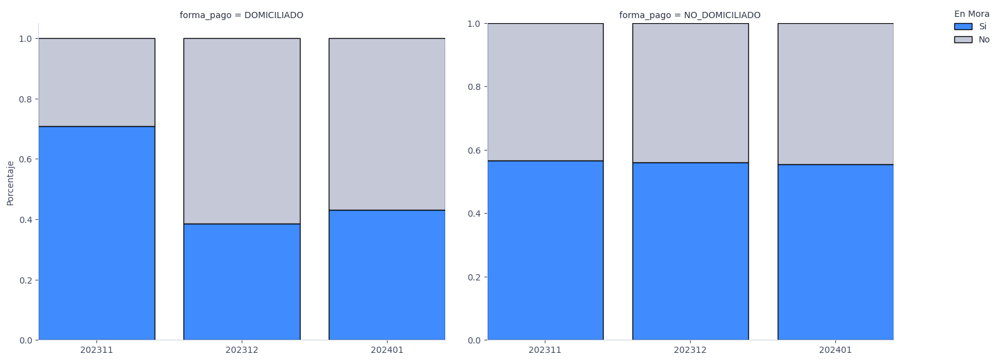

In [65]:
g = sns.FacetGrid(df_cartera.sort_values(['aniomes','target_str']), col="forma_pago",height=6,aspect=1.2,sharex=False,sharey=False)
g.map_dataframe(sns.histplot,x='aniomes',multiple='fill',hue='target_str',palette=paleta_mora,shrink=0.8).add_legend()
g.set_ylabels('Porcentaje')
g.set_xlabels('')
g.add_legend(title='En Mora',labels=['Si','No'])
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

## analisis variable categoricas

In [66]:
df_cartera.groupby('aniomes')['vencimiento'].value_counts(normalize=True).mul(100).round(2).sort_index().reset_index()

,aniomes,vencimiento,proportion
0,202311,0.0,18.71
1,202311,1.0,81.29
2,202312,0.0,36.87
3,202312,1.0,63.13
4,202401,0.0,54.68
5,202401,1.0,45.32


In [67]:
df_cartera['vencimiento'].unique()

array([ 0.,  1., nan])

In [68]:
cols_to_plot = [col for col in numericas_categoricas if col != 'target']+['aniomes']
for col in cols_to_plot:
    df_cartera.sort_values(col, inplace=True)   
    fig = make_subplots(rows=1, cols=2, subplot_titles=('Cantidad', 'Porcentual'),
                        specs=[[{"type": "bar"}, {"type": "bar"}]])
    df_cartera_grouped_q = df_cartera.groupby(['target_str', col]).size().unstack(fill_value=0)

    for target in df_cartera['target_str'].unique():
        fig.add_trace(
            go.Bar(x=df_cartera_grouped_q.columns, y=df_cartera_grouped_q.loc[target], 
                   name=target, marker_color=paleta_mora[target]),
            row=1, col=1
        )
    
    df_cartera_grouped = df_cartera_grouped_q.div(df_cartera_grouped_q.sum(axis=1), axis=0) * 100
    
    for target in df_cartera['target_str'].unique():
        fig.add_trace(
            go.Bar(x=df_cartera_grouped.columns, y=df_cartera_grouped.loc[target], 
                   name=target, marker_color=paleta_mora[target]),
            row=1, col=2
        )
    
    fig.update_layout(
        height=400, 
        width=1200,
        title_text=f"Distribución de {col}", 
        title_x=0.5,
        title_font_size=16,
        barmode='group'
    )
    
    fig.update_xaxes(title_text=col, row=1, col=1)
    fig.update_xaxes(title_text=col, row=1, col=2)
    fig.update_yaxes(title_text="Cantidad", row=1, col=1)
    fig.update_yaxes(title_text="Porcentaje", row=1, col=2)
    
    fig.show()
    fig.write_image(str(FIGURES_DIR / f'distribucion_{col}.svg'))
    fig.write_image(str(FIGURES_DIR / f'distribucion_{col}.png'))

## Arquetipo de la Persona que ha caido en mora

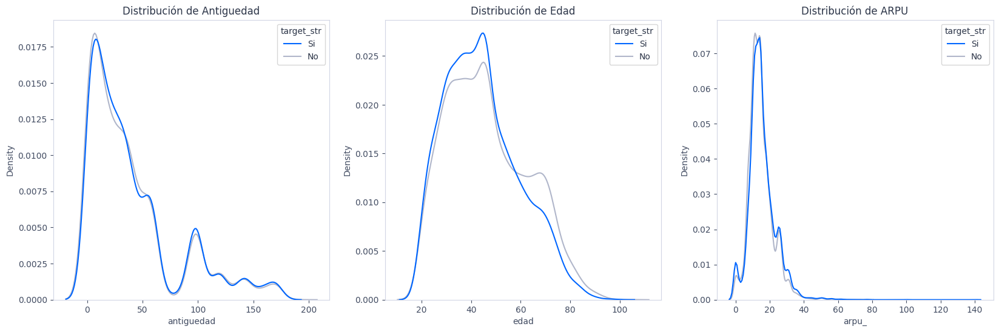

In [69]:
fig, ax = plt.subplots(1,3,figsize=(20,6))

sns.kdeplot(data= df_cartera, x='antiguedad',hue='target_str',common_norm=False,palette=paleta_mora,ax=ax[0])
sns.kdeplot(data= df_cartera, x='edad',hue='target_str',common_norm=False,palette=paleta_mora,ax=ax[1])
sns.kdeplot(data= df_cartera, x='arpu_',hue='target_str',common_norm=False,palette=paleta_mora,ax=ax[2])
ax[0].set_title('Distribución de Antiguedad')
ax[1].set_title('Distribución de Edad')
ax[2].set_title('Distribución de ARPU')
plt.show()

<Axes: xlabel='ratio_recurrencia_cartera', ylabel='Density'>

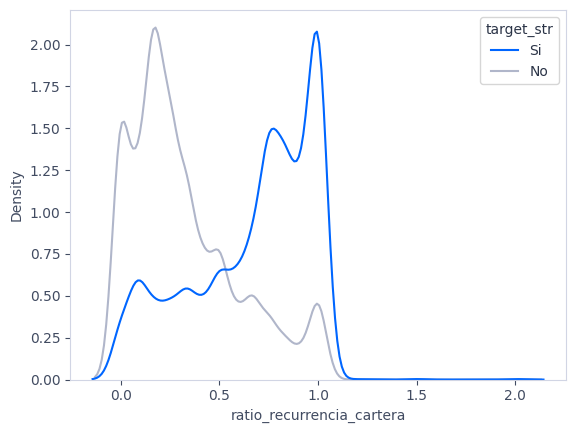

In [70]:
sns.kdeplot(data= df_cartera, x='ratio_recurrencia_cartera',hue='target_str',common_norm=False,palette=paleta_mora)

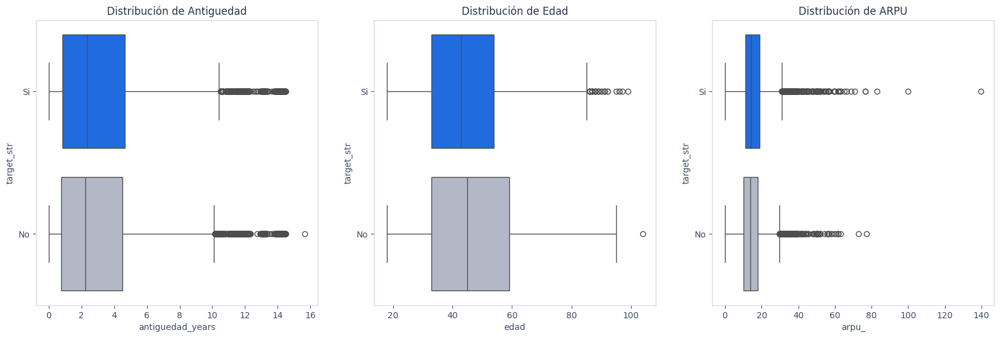

In [71]:
fig, ax = plt.subplots(1,3,figsize=(20,6))
sns.boxplot(data= df_cartera, x='antiguedad_years', y ='target_str',palette=paleta_mora,ax=ax[0])
sns.boxplot(data= df_cartera, x='edad', y ='target_str',palette=paleta_mora,ax=ax[1])
sns.boxplot(data= df_cartera, x='arpu_', y ='target_str',palette=paleta_mora,ax=ax[2])
ax[0].set_title('Distribución de Antiguedad')
ax[1].set_title('Distribución de Edad')
ax[2].set_title('Distribución de ARPU')
plt.show()

### ARPU

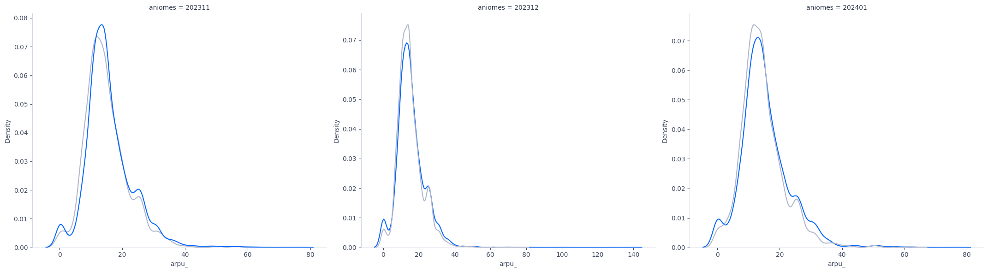

In [72]:
g = sns.FacetGrid(data=df_cartera.sort_values('aniomes'),col='aniomes',height=6,aspect=1.2,sharex=False,sharey=False)
g.map_dataframe(sns.kdeplot,data= df_cartera, x='arpu_',hue='target_str',common_norm=False,palette=paleta_mora).add_legend()

### edad

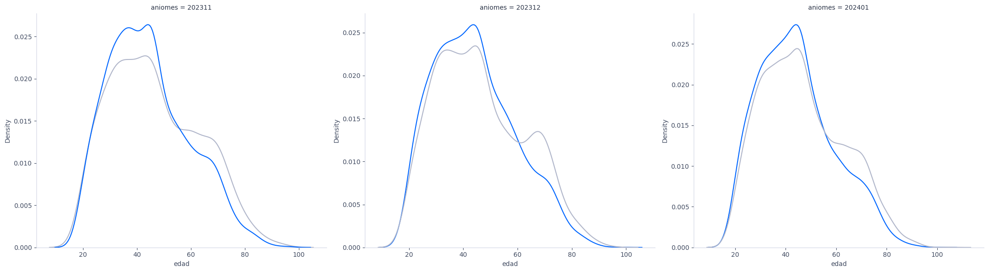

In [73]:
g = sns.FacetGrid(data=df_cartera.sort_values('aniomes'),col='aniomes',height=6,aspect=1.2,sharex=False,sharey=False)
g.map_dataframe(sns.kdeplot,data= df_cartera, x='edad',hue='target_str',common_norm=False,palette=paleta_mora).add_legend()

### Antiguedad

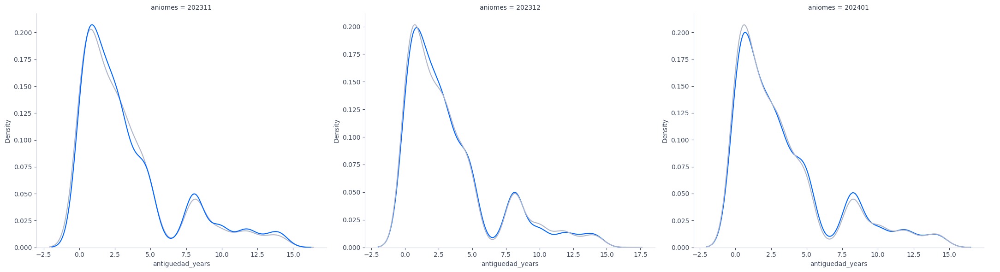

In [74]:
g = sns.FacetGrid(data=df_cartera.sort_values('aniomes'),col='aniomes',height=6,aspect=1.2,sharex=False,sharey=False)
g.map_dataframe(sns.kdeplot,data= df_cartera, x='antiguedad_years',hue='target_str',common_norm=False,palette=paleta_mora).add_legend()

Resto de variable que podrian ser interesantes de analizar

### Analisis bibariado de las variables numericas

In [75]:
cols_to_pairplot = numericas_continuas + ['target']
fig = sns.pairplot(df_cartera[cols_to_pairplot],hue='target',plot_kws={'alpha':0.5},palette=paleta_mora_num,corner=True)
fig.savefig(str(FIGURES_DIR / 'pairplot.png'))

vistazo a profundidad

## Outliers en el Dataset

In [76]:
outliers_summary = analyze_outliers_with_target(df_cartera, numericas_continuas, 'target')
outliers_summary.head()

,Variable,Total_Outliers_Target_1,Total_Outliers_Target_0,Percent_Outliers_Target_1,Percent_Outliers_Target_0,Total_Outliers,Percent_Outliers
3,pct_datos_3g,678,595,53.260016,46.739984,1273,5.921206
29,conteo_vecesen_finterm,516,406,55.965293,44.034707,922,4.288572
0,max_diferencia_dias_ultimos3m,313,78,80.051151,19.948849,391,1.818689
2,promedio_ultimos3m_finterm,236,148,61.458333,38.541667,384,1.786130
8,tot_dow_datos_3g,224,151,59.733333,40.266667,375,1.744267


In [79]:
n_top = 10
df_top_5 = outliers_summary.iloc[:n_top, :][['Variable', 'Percent_Outliers_Target_1', 'Percent_Outliers_Target_0']]
df_top_5.rename(columns={'Percent_Outliers_Target_1': 'Si', 'Percent_Outliers_Target_0': 'No'}, inplace=True)
df_melt = df_top_5.melt(id_vars='Variable', value_vars=['Si', 'No'],
                        var_name='Target', value_name='Percent Outliers')
fig = px.bar(df_melt, 
             y='Variable', 
             x='Percent Outliers', 
             color='Target', 
             color_discrete_sequence=[paleta.color_coral,paleta.color_grey_3], 
             title=f'Top {n_top} Variables con más Outliers')
fig.update_layout(legend_title_text='En Mora',width=800, height=500,xaxis_title='Porcentaje',yaxis_title='')

fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig.show()
fig.write_image(str(FIGURES_DIR / 'top_outliers.png'))

## Mapa de correlacion

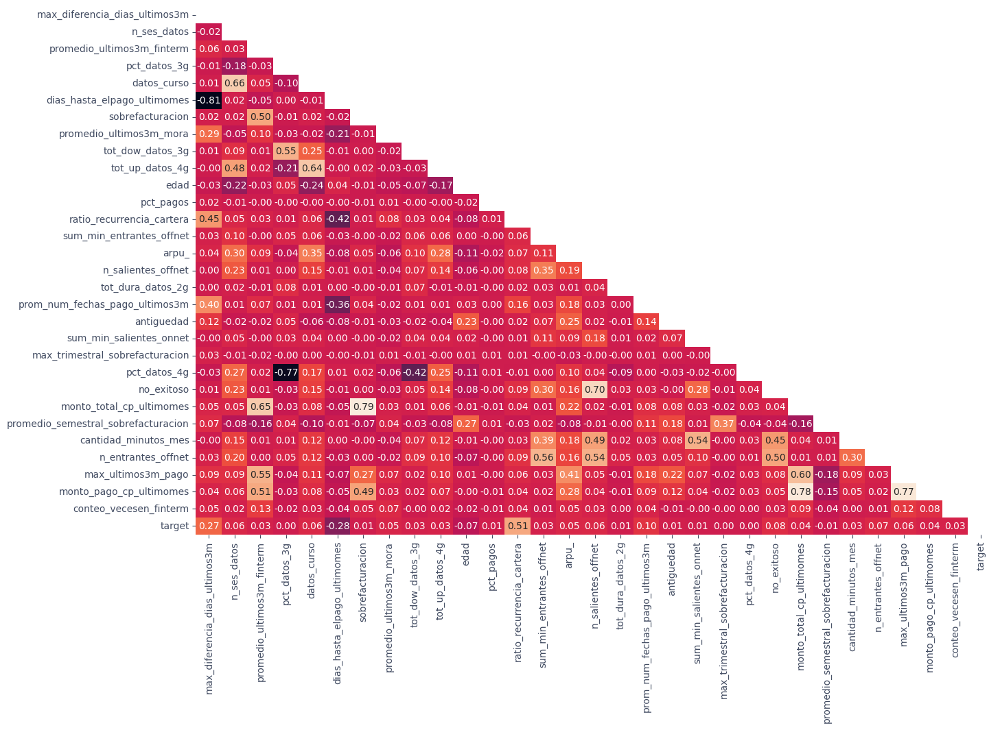

In [78]:
corr = df_cartera[numericas_continuas+['target']].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", ax=ax,cbar=False)
plt.show()
fig.savefig(str(FIGURES_DIR / 'correlation_matrix.png'))